In [3]:
%pylab inline
import os
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask

Populating the interactive namespace from numpy and matplotlib


In [4]:
cd wrkDir/sim/HSC-like-sim/

/work/xiangchong.li/work/massMapSparse/sim/HSC-like-sim


In [20]:
# Simulation
iz  =   2
im  =   7
isim=   52

In [21]:
# Pixelation
hdir='pix96-nl15'
odir='./' 

outfname0   =  os.path.join(hdir,'pixSigma-%d%d.fits' %(iz,im))
outfname1   =  os.path.join(hdir,'pixShearR-g1-%d%d-sim%d.fits' %(iz,im,isim))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d%d-sim%d.fits' %(iz,im,isim))
outfname3   =  os.path.join(hdir,'pixStd.fits')
outfname4   =  os.path.join(hdir,'lensing_kernel.fits' )
assert os.path.isfile(outfname0)
assert os.path.isfile(outfname1)
assert os.path.isfile(outfname2)
assert os.path.isfile(outfname3)
assert os.path.isfile(outfname4)

In [22]:
# configuration
configName  =   'config-pix96-nl15.ini'
parser      =   ConfigParser()
parser.read(configName)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)
parser.set('file','outDir',odir)
parser.set('lensZ','zmin','0.05')
parser.set('lensZ','zscale','0.05')
parser.set('lensZ','nlp','15')

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))


# Reconstruction Init
tau=0.
parser.set('sparse','lbd','5.' )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','1' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)

1.5
pix96-nl15/pixShearR-g2-27-sim52.fits


726913920419470.2
156998653210404.78
726913920419470.2


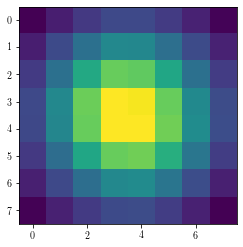

In [23]:
rshow=4
sigmafname=   os.path.join(hdir,'pixSigma-%d%d.fits' %(iz,im))
Sigma=pyfits.getdata(sigmafname)
toshow=Sigma[48-rshow:48+rshow,48-rshow:48+rshow]
plt.imshow(toshow)
print(np.abs(toshow).max())
print(toshow.min())
print(toshow.max())

# sparse analysis

In [24]:
sparse3D.process(1500)

In [26]:
p=np.zeros(sparse3D.shapeA)
ss=sparse3D.alphaR*sparse3D._w

for izl in range(sparse3D.nlp):
    for ifr in range(sparse3D.nframe):
        if ifr==0:
            rsmth=0#int(2**(1.-izl/8.)+0.5)
        else:
            rsmth=0
        print(rsmth)
        for jsh in range(-rsmth,rsmth+1):
            dif    =   np.roll(ss[izl,ifr],jsh,axis=-2)
            for ish in range(-rsmth,rsmth+1):
                dif2=   np.roll(dif,ish,axis=-1)
                p[izl,ifr] += dif2/(2.*rsmth+1.)#**2. snr

p=np.abs(p)

# weight with normalized results?
p=p/sparse3D._w/5.

thres_adp=1./1e10
mask=(p>thres_adp)

w=np.zeros(sparse3D.shapeA)
w[mask]=1./(p[mask])**(2.)
w[~mask]=1./thres_adp
sparse3D.fista_gradient_descent(800,w=w)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [27]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.95,0.70,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.05,0.8]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

39.0907244724109
0.0
39.0907244724109


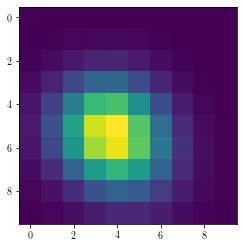

In [12]:
ishow=0
rshow=5
gridInfo    =   cartesianGrid3D(parser)
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
ratio=1#(rhoM_ave*DaBin)
toshow=sparse3D.deltaR[ishow,48-rshow:48+rshow,48-rshow:48+rshow]*ratio
plt.imshow(toshow)
print(np.abs(toshow).max())
print(toshow.min())
print(toshow.max())

In [19]:
data=pyfits.getdata('./sparse-f1/deltaR-27-sim52-lasso.fits')
ipv.figure()
vol1=ipv.volshow(data,level=[0.95,0.70,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.05,0.80]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

31.074944280026365
0.0
31.074944280026365


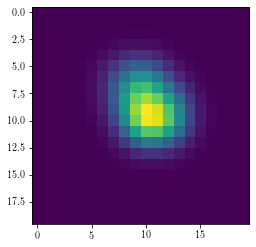

In [136]:
ishow=6
rshow=10
gridInfo    =   cartesianGrid3D(parser)
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
ratio=1.#(rhoM_ave*DaBin)
toshow=data[ishow,48-rshow:48+rshow,48-rshow:48+rshow]*ratio
plt.imshow(toshow)
print(np.abs(toshow).max())
print(toshow.min())
print(toshow.max())

0.9 17.88


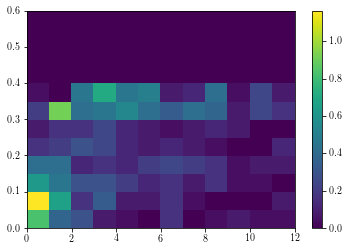

In [189]:
a=pyfits.getdata('sparse-f1/src-37-lasso.fits')
dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
dz=np.abs(a['dZ'])
plt.hist2d(dr,dz,bins=(12,12),density=True,range=((0,12),(0,0.6)))
plt.colorbar()
mask=(dr<=2.5)&(dz<0.15)
nreal=len(np.unique(a[mask]['isim']))
nfalse=len(a)-nreal
print(nreal/100.,nfalse/100.)

0.9 2.05


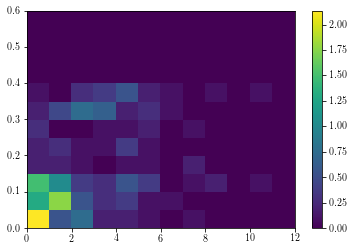

In [188]:
a=pyfits.getdata('sparse-f1/src-37-alasso2.fits')
dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
dz=np.abs(a['dZ'])
hist=plt.hist2d(dr,dz,bins=(12,12),density=True,range=((0,12),(0,0.6)))
plt.colorbar()
mask=(dr<=2.5)&(dz<0.15)
nreal=len(np.unique(a[mask]['isim']))
nfalse=len(a)-nreal
print(nreal/100.,nfalse/100.)

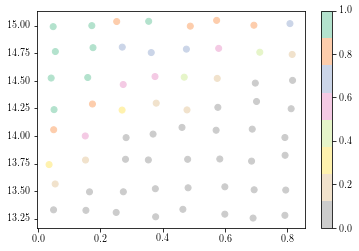

In [215]:
cat=Table.read('sims/haloCat-202009201646.csv')
cat['detRat']=None
cat['falRat']=None
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('sparse-f1/src-%d%d-alasso2.fits' %(iz,im))
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.15)
    nreal=len(np.unique(a[mask]['isim']))
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100.
plt.scatter(cat['zh'],cat['log10_M200'],c=cat['detRat'],cmap='Pastel2_r')
plt.colorbar()

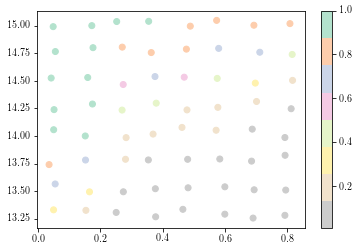

In [216]:
cat2=Table.read('sims/haloCat-202009201646.csv')
cat2['detRat']=None
cat2['falRat']=None
for ic in cat2:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('sparse-f1/src-%d%d-lasso.fits' %(iz,im))
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.15)
    nreal=len(np.unique(a[mask]['isim']))
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100.
plt.scatter(cat2['zh'],cat2['log10_M200'],c=cat2['detRat'],cmap='Pastel2_r')
plt.colorbar()

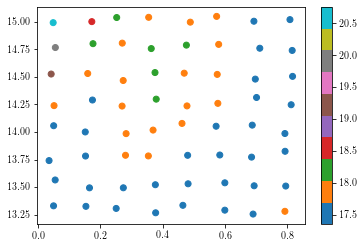

In [204]:
plt.scatter(cat2['zh'],cat2['log10_M200'],c=cat2['falRat'],cmap='tab10')
plt.colorbar()

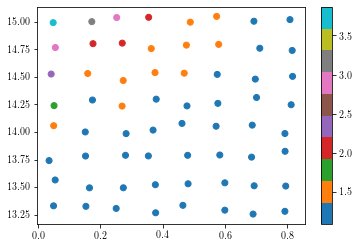

In [205]:
plt.scatter(cat['zh'],cat['log10_M200'],c=cat['falRat'],cmap='tab10')
plt.colorbar()